# PCA

In [1]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('digit.csv')

In [3]:
df.shape

(42000, 785)

In [4]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
20539,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
import matplotlib.pyplot as plt

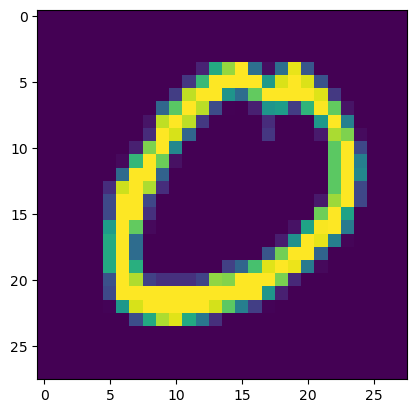

In [6]:
plt.imshow(df.iloc[13051,1:].values.reshape(28,28))

In [7]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [8]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [9]:
X_train.shape

(33600, 784)

In [10]:
from sklearn.neighbors import KNeighborsClassifier

In [11]:
knn = KNeighborsClassifier()

In [12]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [13]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

8.989309072494507


In [14]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [15]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [16]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [17]:
# PCA 
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [18]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [19]:
X_train_trf.shape

(33600, 200)

In [20]:
knn = KNeighborsClassifier()

In [21]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [22]:
y_pred = knn.predict(X_test_trf)

In [23]:
accuracy_score(y_test,y_pred)

0.9503571428571429

In [24]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [25]:
X_train_trf

array([[-2.71850896, -0.48994342],
       [-0.67687859, -6.75359654],
       [-3.033376  ,  6.50995832],
       ...,
       [ 2.14872705,  0.78078919],
       [ 1.05962165,  0.94759234],
       [17.70260436,  1.96195439]])

In [26]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [27]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [28]:
X_train_trf

array([[-2.71866202, -0.48965423,  1.13559533],
       [-0.67690732, -6.75400594, -2.33630692],
       [-3.0332348 ,  6.50969379,  7.49194047],
       ...,
       [ 2.14887737,  0.78052612, -0.74747855],
       [ 1.05950249,  0.94802379,  3.94989076],
       [17.70257539,  1.96170026, -4.94379272]])

In [29]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0],y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [30]:
pca.explained_variance_
# Eigen values

array([40.67111198, 29.17023396, 26.74459616])

In [31]:
pca.components_.shape
# Eigen vectors

(3, 784)

In [32]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [33]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [34]:
pca.explained_variance_.shape

(784,)

In [35]:
pca.components_.shape

(784, 784)

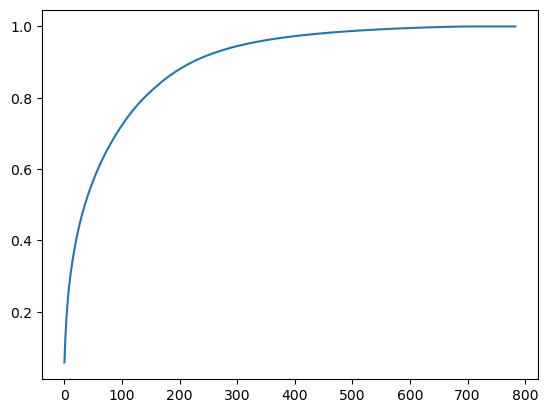

In [36]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

# PCA_STEP_BY_STEP

In [37]:
import numpy as np
import pandas as pd

np.random.seed(23) 

mu_vec1 = np.array([0,0,0])
cov_mat1 = np.array([[1,0,0],[0,1,0],[0,0,1]])
class1_sample = np.random.multivariate_normal(mu_vec1, cov_mat1, 20)

df = pd.DataFrame(class1_sample,columns=['feature1','feature2','feature3'])
df['target'] = 1

mu_vec2 = np.array([1,1,1])
cov_mat2 = np.array([[1,0,0],[0,1,0],[0,0,1]])
class2_sample = np.random.multivariate_normal(mu_vec2, cov_mat2, 20)

df1 = pd.DataFrame(class2_sample,columns=['feature1','feature2','feature3'])

df1['target'] = 0

df = pd.concat([df,df1],ignore_index=True)

df = df.sample(40)

In [38]:
df.head()

,feature1,feature2,feature3,target
2,-0.367548,-1.137460,-1.322148,1
34,0.177061,-0.598109,1.226512,0
14,0.420623,0.411620,-0.071324,1
11,1.968435,-0.547788,-0.679418,1
12,-2.506230,0.146960,0.606195,1


In [39]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=df['feature1'], y=df['feature2'], z=df['feature3'],
              color=df['target'].astype('str'))
fig.update_traces(marker=dict(size=12,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

fig.show()

In [40]:
# Step 1 - Apply standard scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

df.iloc[:,0:3] = scaler.fit_transform(df.iloc[:,0:3])

In [41]:
# Step 2 - Find Covariance Matrix
covariance_matrix = np.cov([df.iloc[:,0],df.iloc[:,1],df.iloc[:,2]])
print('Covariance Matrix:\n', covariance_matrix)

Covariance Matrix:
 [[1.02564103 0.20478114 0.080118  ]
 [0.20478114 1.02564103 0.19838882]
 [0.080118   0.19838882 1.02564103]]


In [42]:
# Step 3 - Finding EV and EVs
eigen_values, eigen_vectors = np.linalg.eig(covariance_matrix)

In [43]:
eigen_values

array([1.3536065 , 0.94557084, 0.77774573])

In [44]:
eigen_vectors

array([[-0.53875915, -0.69363291,  0.47813384],
       [-0.65608325, -0.01057596, -0.75461442],
       [-0.52848211,  0.72025103,  0.44938304]])

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


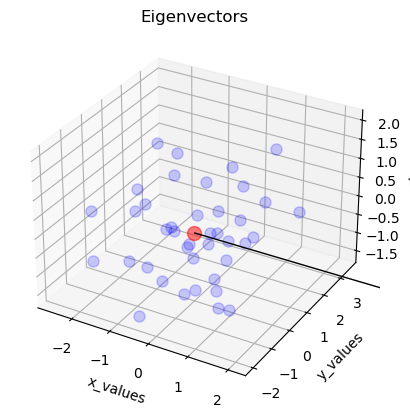

In [45]:
%pylab inline

import numpy as np
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d

class Arrow3D(FancyArrowPatch):
    def __init__(self, xs, ys, zs, *args, **kwargs):
        super().__init__((0,0), (0,0), *args, **kwargs)
        self._verts3d = xs, ys, zs

    def do_3d_projection(self, renderer=None):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, self.axes.M)
        self.set_positions((xs[0],ys[0]),(xs[1],ys[1]))

        return np.min(zs)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')


ax.plot(df['feature1'], df['feature2'], df['feature3'], 'o', markersize=8, 
        color='blue', alpha=0.2)
ax.plot([df['feature1'].mean()], [df['feature2'].mean()], [df['feature3'].mean()],
        'o', markersize=10, color='red', alpha=0.5)
for v in eigen_vectors.T:
    a = Arrow3D([df['feature1'].mean(), v[0]], [df['feature2'].mean(), v[1]],
                [df['feature3'].mean(), v[2]], mutation_scale=20, lw=3, 
                arrowstyle="-|>", color="r")




arrow_prop_dict = dict(mutation_scale=20, arrowstyle='-|>', color='k', 
                       shrinkA=0, shrinkB=0)
a = Arrow3D([0, 10], [0, 0], [0, 0], **arrow_prop_dict)
ax.add_artist(a)

ax.set_xlabel('x_values')
ax.set_ylabel('y_values')
ax.set_zlabel('z_values')

plt.title('Eigenvectors')

plt.show()

In [46]:
pc = eigen_vectors[0:2]
pc

array([[-0.53875915, -0.69363291,  0.47813384],
       [-0.65608325, -0.01057596, -0.75461442]])

In [47]:
transformed_df = np.dot(df.iloc[:,0:3],pc.T)
# 40,3 - 3,2
new_df = pd.DataFrame(transformed_df,columns=['PC1','PC2'])
new_df['target'] = df['target'].values
new_df.head()

,PC1,PC2,target
0,0.599433,1.795862,1
1,1.056919,-0.212737,0
2,-0.271876,0.498222,1
3,-0.621586,0.023110,1
4,1.567286,1.730967,1


In [48]:
new_df['target'] = new_df['target'].astype('str')
fig = px.scatter(x=new_df['PC1'],
                 y=new_df['PC2'],
                 color=new_df['target'],
                 color_discrete_sequence=px.colors.qualitative.G10
                )

fig.update_traces(marker=dict(size=12,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

# PCA VARIANTS

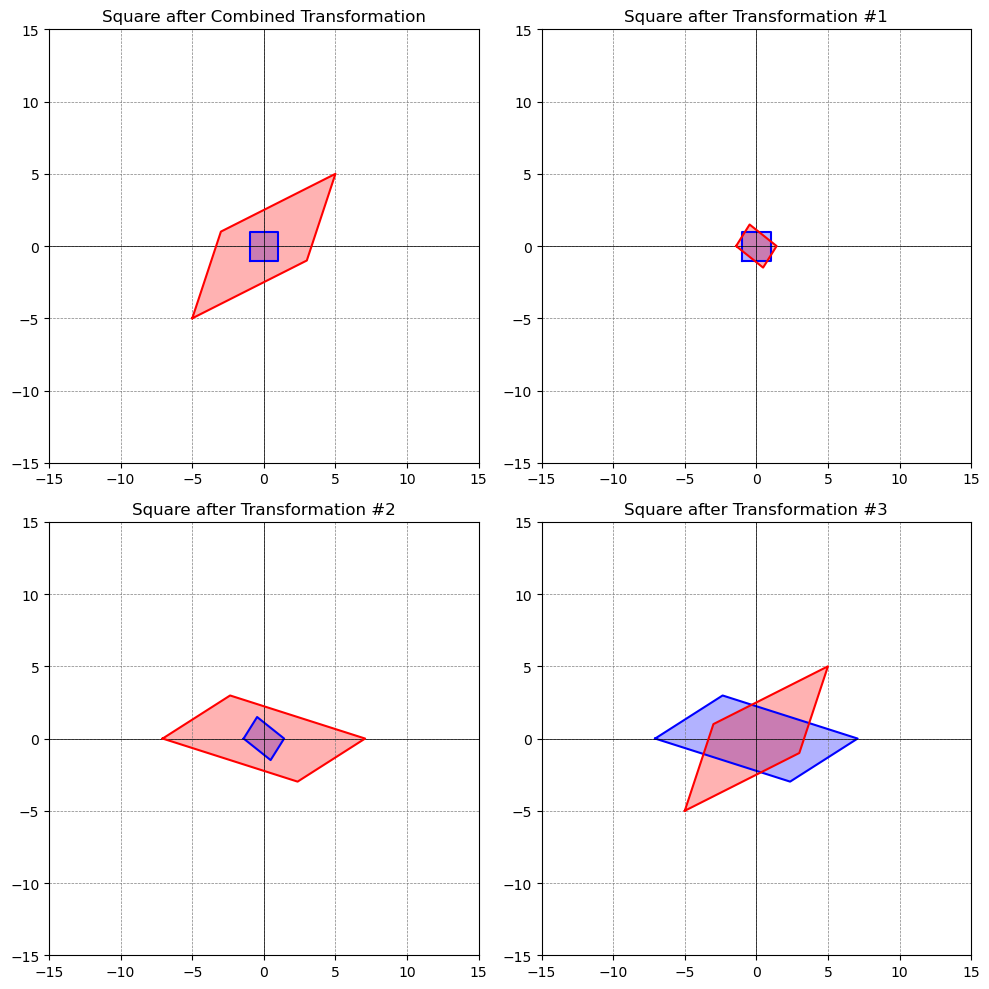

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, clear_output

# Plot initial coordinate axis and unit square
def plot_square(ax, square):
    ax.plot(square[0, :], square[1, :], 'b')
    ax.fill(square[0, :], square[1, :], 'blue', alpha=0.3)
    ax.set_xlim(-15, 15)
    ax.set_ylim(-15, 15)
    ax.axhline(0, color='black',linewidth=0.5)
    ax.axvline(0, color='black',linewidth=0.5)
    ax.grid(color = 'gray', linestyle = '--', linewidth = 0.5)

# Apply transformation and plot
def plot_transformed_square(ax, matrix, square):
    transformed_square = np.dot(matrix, square)
    ax.plot(transformed_square[0, :], transformed_square[1, :], 'r')
    ax.fill(transformed_square[0, :], transformed_square[1, :], 'red', alpha=0.3)
    return transformed_square

# Initialize unit square
square = np.array([[-1, -1], [-1, 1], [1, 1], [1, -1], [-1, -1]]).T

# Inputs for 3 2x2 matrices

# Replace with your matrix
matrix1 = np.array([[ 0.94280904, 0.47140452], [-0.74535599, 0.74535599]]) 

# Replace with your matrix
matrix2 = np.array([[5, 0], [0, 2]])  

# Replace with your matrix
matrix3 = np.array([[ 0.70710678, -0.4472136 ],[ 0.70710678, 0.89442719]])  
matrices = [matrix1, matrix2, matrix3]

# Calculate product of all three matrices
product_matrix = np.dot(matrix3, np.dot(matrix2, matrix1))

# Create 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

# Plot combined transformation as the first graph
plot_square(axs[0, 0], square)
square_combined = plot_transformed_square(axs[0, 0], product_matrix, square)
axs[0, 0].set_title('Square after Combined Transformation')

# Plot individual transformations as the remaining graphs
for i, (matrix, ax) in enumerate(zip(matrices, axs.flat[1:]), start=1):
    plot_square(ax, square)
    square = plot_transformed_square(ax, matrix, square)
    ax.set_title(f'Square after Transformation #{i}')

# Adjust layout to prevent overlapping titles
plt.tight_layout()
plt.show()


In [50]:
import numpy as np

# Define your square matrix
A = np.array([[4, 1], [2, 3]])

# Perform the eigen decomposition
eigenvalues, V = np.linalg.eig(A)

# Create the diagonal matrix of eigenvalues
Lambda = np.diag(eigenvalues)

# Compute the inverse of V
V_inv = np.linalg.inv(V)

# Verify that A = VΛV^(-1)
A_reconstructed = np.dot(V, np.dot(Lambda, V_inv))

# Print the matrices
print("Matrix V (Eigenvectors of A as columns):")
print(V)
print("\nMatrix Λ (Diagonal matrix of Eigenvalues):")
print(Lambda)
print("\nInverse of V:")
print(V_inv)
print("\nReconstructed A (Should be close to original A):")
print(A_reconstructed)

Matrix V (Eigenvectors of A as columns):
[[ 0.70710678 -0.4472136 ]
 [ 0.70710678  0.89442719]]

Matrix Λ (Diagonal matrix of Eigenvalues):
[[5. 0.]
 [0. 2.]]

Inverse of V:
[[ 0.94280904  0.47140452]
 [-0.74535599  0.74535599]]

Reconstructed A (Should be close to original A):
[[4. 1.]
 [2. 3.]]


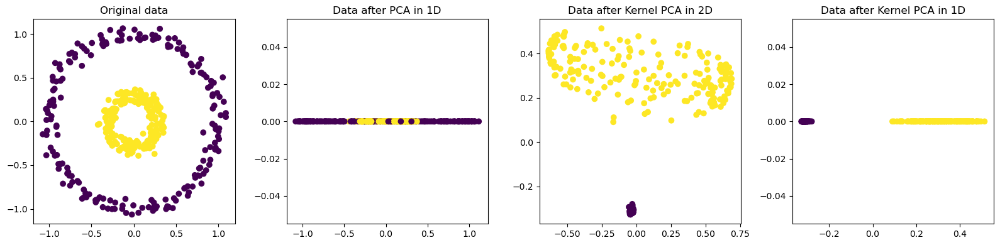

In [51]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA, KernelPCA
from sklearn.datasets import make_circles

# Generate the dataset
X, y = make_circles(n_samples=400, factor=.3, noise=.05)

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Apply Kernel PCA
kpca = KernelPCA(kernel="rbf", gamma=10)
X_kpca = kpca.fit_transform(X)

# Original data plot
plt.figure(figsize=(16, 4))
plt.subplot(1, 4, 1)
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Original data')

# Transformed data with PCA in 1D
plt.subplot(1, 4, 2)
plt.scatter(X_pca[:, 0], np.zeros((400,)), c=y)
plt.title('Data after PCA in 1D')

# Transformed data with Kernel PCA in 2D
plt.subplot(1, 4, 3)
plt.scatter(X_kpca[:, 0], X_kpca[:, 1], c=y)
plt.title('Data after Kernel PCA in 2D')

# Transformed data with Kernel PCA in 1D
plt.subplot(1, 4, 4)
plt.scatter(X_kpca[:, 1], np.zeros((400,)), c=y)
plt.title('Data after Kernel PCA in 1D')

plt.tight_layout()
plt.show()


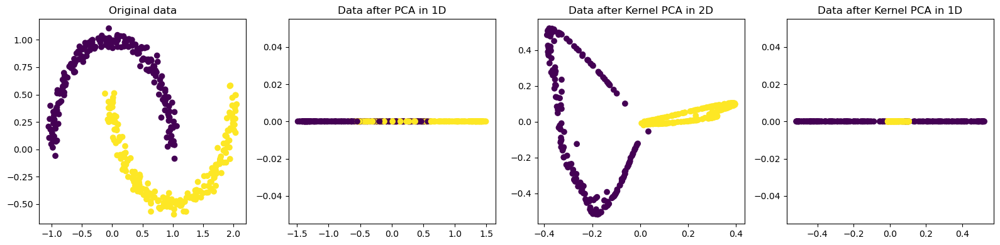

In [52]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA, KernelPCA
from sklearn.datasets import make_moons

# Generate the dataset
X, y = make_moons(n_samples=400, noise=.05)

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Apply Kernel PCA
kpca = KernelPCA(kernel="rbf", gamma=15)
X_kpca = kpca.fit_transform(X)

# Original data plot
plt.figure(figsize=(16, 4))
plt.subplot(1, 4, 1)
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Original data')

# Transformed data with PCA in 1D
plt.subplot(1, 4, 2)
plt.scatter(X_pca[:, 0], np.zeros((400,)), c=y)
plt.title('Data after PCA in 1D')

# Transformed data with Kernel PCA in 2D
plt.subplot(1, 4, 3)
plt.scatter(X_kpca[:, 0], X_kpca[:, 1], c=y)
plt.title('Data after Kernel PCA in 2D')

# Transformed data with Kernel PCA in 1D
plt.subplot(1, 4, 4)
plt.scatter(X_kpca[:, 1], np.zeros((400,)), c=y)
plt.title('Data after Kernel PCA in 1D')

plt.tight_layout()
plt.show()


In [53]:
import plotly.graph_objs as go
from sklearn.datasets import make_moons
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import KernelPCA
import numpy as np

# Create the half moon data
X, y = make_moons(n_samples=500, noise=0.02)

# Standardize the data
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# Apply the RBF kernel PCA
kpca = KernelPCA(n_components=3, kernel='rbf', gamma=15)
X_kpca = kpca.fit_transform(X_std)

# Create a trace for the original data
trace1 = go.Scatter(x=X_std[y==0, 0], y=X_std[y==0, 1],
                    mode='markers', name='Class 0',
                    marker=dict(color='red', size=5, opacity=0.5))
trace2 = go.Scatter(x=X_std[y==1, 0], y=X_std[y==1, 1],
                    mode='markers', name='Class 1',
                    marker=dict(color='blue', size=5, opacity=0.5))

# Create a trace for the transformed data
trace3 = go.Scatter3d(x=X_kpca[y==0, 0], y=X_kpca[y==0, 1], z=X_kpca[y==0, 2],
                      mode='markers', name='Class 0',
                      marker=dict(color='red', size=5, opacity=0.5))
trace4 = go.Scatter3d(x=X_kpca[y==1, 0], y=X_kpca[y==1, 1], z=X_kpca[y==1, 2],
                      mode='markers', name='Class 1',
                      marker=dict(color='blue', size=5, opacity=0.5))

# Create the layouts
layout1 = go.Layout(title='Original data in 2D', autosize=True,
                    xaxis=dict(title='Feature 1'),
                    yaxis=dict(title='Feature 2'))
layout2 = go.Layout(title='Data after RBF Kernel PCA in 3D', autosize=True,
                    scene=dict(xaxis=dict(title='PC 1'),
                               yaxis=dict(title='PC 2'),
                               zaxis=dict(title='PC 3')))

# Create the figures and plot
fig1 = go.Figure(data=[trace1, trace2], layout=layout1)
fig2 = go.Figure(data=[trace3, trace4], layout=layout2)

fig1.show()
fig2.show()


## Kernel PCA step by step

Text(0.5, 1.0, 'Original data')

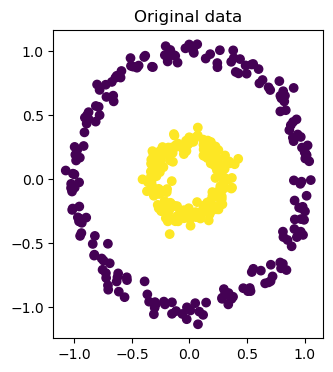

In [54]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA, KernelPCA
from sklearn.datasets import make_circles
import numpy as np

# Generate the dataset
X, y = make_circles(n_samples=400, factor=.3, noise=.05)

# Original data plot
plt.figure(figsize=(16, 4))
plt.subplot(1, 4, 1)
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Original data')

In [55]:
X_centered = X - np.mean(X, axis=0)

Text(0.5, 1.0, 'Original data')

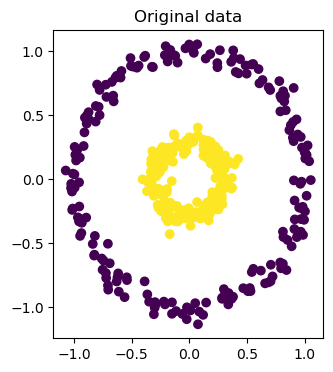

In [56]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 4, 1)
plt.scatter(X_centered[:, 0], X_centered[:, 1], c=y)
plt.title('Original data')

In [57]:
def rbf_kernel(x1, x2, gamma=0.1):
    distance = np.linalg.norm(x1 - x2) ** 2
    return np.exp(-gamma * distance)

# Create the kernel matrix
n_samples = X.shape[0]
K = np.zeros((n_samples, n_samples))
for i in range(n_samples):
    for j in range(n_samples):
        K[i, j] = rbf_kernel(X_centered[i], X_centered[j])


In [58]:
K.shape

(400, 400)

In [59]:
from scipy.linalg import eigh
eigenvalues, eigenvectors = eigh(K)

In [60]:
eigenvectors.shape

(400, 400)

In [61]:
# Reverse the arrays as eigh returns them in ascending order
eigenvalues = eigenvalues[::-1]
eigenvectors = eigenvectors[:, ::-1]

In [62]:
eigenvalues.shape

(400,)

In [63]:
eigenvectors.shape

(400, 400)

In [64]:
k = 2
X_kpca = eigenvectors[:, :k]

In [65]:
X_kpca.shape

(400, 2)

Text(0.5, 1.0, 'Data after Kernel PCA in 1D')

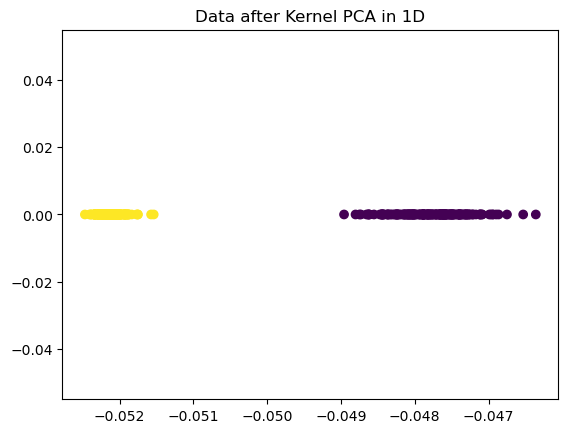

In [66]:
plt.scatter(X_kpca[:, 0], np.zeros((400,)), c=y)
plt.title('Data after Kernel PCA in 1D')

In [67]:
import numpy as np

# Create a 2D matrix
A = np.array([[1,2], [3,4]])

# Perform SVD
U, S, VT = np.linalg.svd(A)

# U and VT are the left and right singular vectors, while S contains the 
#                                                             singular values.

# Note: S is a 1-D array rather than a diagonal matrix. To convert it into a 
#                                       diagonal matrix, you can use np.diag().

print("U:\n", U)
print("S:\n", np.diag(S))
print("VT:\n", VT)


U:
 [[-0.40455358 -0.9145143 ]
 [-0.9145143   0.40455358]]
S:
 [[5.4649857  0.        ]
 [0.         0.36596619]]
VT:
 [[-0.57604844 -0.81741556]
 [ 0.81741556 -0.57604844]]


# SVD

In [68]:
import numpy as np
import plotly.graph_objects as go

# Define the 8 vertices of a cube in 3D space
cube = np.array([
    [0, 0, 0],
    [1, 0, 0],
    [1, 1, 0],
    [0, 1, 0],
    [0, 0, 1],
    [1, 0, 1],
    [1, 1, 1],
    [0, 1, 1]
])

# Create a list of edges to build the cube
edges = [(0, 1), (1, 2), (2, 3), (3, 0),  # edges on the bottom face
         (4, 5), (5, 6), (6, 7), (7, 4),  # edges on the top face
         (0, 4), (1, 5), (2, 6), (3, 7)]  # edges on the sides

# Define a 2x3 transformation matrix
A = np.array([[1, 2, 1], [2, 1, 0]])

# Apply the transformation
transformed_cube = np.dot(A, cube.T).T

# Create a 3D plot for the original cube
fig1 = go.Figure()

for edge in edges:
    x0, y0, z0 = cube[edge[0]]
    x1, y1, z1 = cube[edge[1]]
    fig1.add_trace(go.Scatter3d(x=[x0, x1], y=[y0, y1], z=[z0, z1], mode='lines'))

fig1.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
                   width=700, margin=dict(r=20, l=10, b=10, t=10))

fig1.show()

# Create a 2D plot for the transformed cube
fig2 = go.Figure()

for edge in edges:
    x0, y0 = transformed_cube[edge[0]]
    x1, y1 = transformed_cube[edge[1]]
    fig2.add_trace(go.Scatter(x=[x0, x1], y=[y0, y1], mode='lines'))

fig2.update_layout(xaxis_title='X', yaxis_title='Y',
                   width=700, margin=dict(r=20, l=10, b=10, t=10))

fig2.show()


In [69]:
import numpy as np

a = np.array([[1,2,1],[2,0,1]])

U,S,V_t = np.linalg.svd(a)

In [70]:
U

array([[ 0.76301998, -0.6463749 ],
       [ 0.6463749 ,  0.76301998]])

In [71]:
S

array([2.92256416, 1.56799832])

In [72]:
#Create a 3x2 matrix filled with zeros
S_full = np.zeros((U.shape[1], V_t.shape[0]))

S_full[:S.shape[0], :S.shape[0]] = np.diag(S)


In [73]:
S_full[:,[0,1]]

array([[2.92256416, 0.        ],
       [0.        , 1.56799832]])

In [74]:
V_t

array([[ 0.70341305,  0.5221579 ,  0.482246  ],
       [ 0.56101149, -0.82445866,  0.07439108],
       [-0.43643578, -0.21821789,  0.87287156]])

In [75]:
import numpy as np
import plotly.graph_objects as go

# define eight vertices for the unit cube
vertices = np.array([
    [-2.5, -2.5, -2.5],
    [2.5, -2.5, -2.5],
    [2.5, 2.5, -2.5],
    [-2.5, 2.5, -2.5],
    [-2.5, -2.5, 2.5],
    [2.5, -2.5, 2.5],
    [2.5, 2.5, 2.5],
    [-2.5, 2.5, 2.5]
])

# define the twelve edges of the cube
edges = [
    (0, 1), (1, 2), (2, 3), (3, 0),  # edges in the bottom face
    (4, 5), (5, 6), (6, 7), (7, 4),  # edges in the top face
    (0, 4), (1, 5), (2, 6), (3, 7)   # edges connecting top and bottom faces
]

# create a plotly graph object
fig = go.Figure()

# add each edge to the graph
for edge in edges:
    x_values = [vertices[edge[0], 0], vertices[edge[1], 0]]
    y_values = [vertices[edge[0], 1], vertices[edge[1], 1]]
    z_values = [vertices[edge[0], 2], vertices[edge[1], 2]]
    fig.add_trace(go.Scatter3d(x=x_values, y=y_values, z=z_values, mode='lines',
                               line=dict(color='black')))

# Draw axis lines
for i, color in enumerate(['red', 'green', 'blue']):# i=0 is X, i=1 is Y,i=2 is Z
    axis = np.zeros((2, 3))
    axis[1, i] = 1
    axis_line = axis * 5  # scale to the desired length
    fig.add_trace(go.Scatter3d(x=axis_line[:, 0], y=axis_line[:, 1], 
                               z=axis_line[:, 2], mode='lines', 
                               line=dict(color=color)))

fig.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
                  autosize=False, width=500, height=500,
                  margin=dict(l=50, r=50, b=100, t=100, pad=4))

fig.show()


In [76]:
# Transformation matrix
T = np.array([
    [-0.70341305, -0.5221579 , -0.482246  ],
    [ 0.56101149, -0.82445866,  0.07439108],
    [-0.43643578, -0.21821789,  0.87287156]
])

# create a plotly graph object
fig = go.Figure()

# Add each edge of the original cube to the graph
for edge in edges:
    x_values = [vertices[edge[0], 0], vertices[edge[1], 0]]
    y_values = [vertices[edge[0], 1], vertices[edge[1], 1]]
    z_values = [vertices[edge[0], 2], vertices[edge[1], 2]]
    fig.add_trace(go.Scatter3d(x=x_values, y=y_values, z=z_values, mode='lines',
                               line=dict(color='black')))

# Apply transformation
vertices_transformed = np.dot(vertices, T.T)

# Add each edge of the transformed cube to the graph
for edge in edges:
    x_values = [vertices_transformed[edge[0], 0], vertices_transformed[edge[1],
                                                                       0]]
    y_values = [vertices_transformed[edge[0], 1], vertices_transformed[edge[1],
                                                                       1]]
    z_values = [vertices_transformed[edge[0], 2], vertices_transformed[edge[1],
                                                                       2]]
    fig.add_trace(go.Scatter3d(x=x_values, y=y_values, z=z_values, mode='lines',
                               line=dict(color='blue')))

# Draw axis lines
for i, color in enumerate(['red', 'green', 'blue']): # i=0 is X,i=1 is Y,i=2 is Z
    axis = np.zeros((2, 3))
    axis[1, i] = 1
    axis_line = axis * 5  # scale to the desired length
    fig.add_trace(go.Scatter3d(x=axis_line[:, 0], y=axis_line[:, 1], 
                               z=axis_line[:, 2], mode='lines', 
                               line=dict(color=color)))

fig.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
                  autosize=False, width=500, height=500,
                  margin=dict(l=50, r=50, b=100, t=100, pad=4))

fig.show()


In [77]:
# Transformation matrix for projection onto X-Y plane
P = np.array([
    [1, 0, 0],
    [0, 1, 0]
])

# Apply transformation
vertices_transformed_2d = np.dot(vertices_transformed, P.T)

# create a plotly graph object for 2D
fig2d = go.Figure()

# Add each edge of the transformed cube to the graph
for edge in edges:
    x_values = [vertices_transformed_2d[edge[0], 0], 
                vertices_transformed_2d[edge[1], 0]]
    y_values = [vertices_transformed_2d[edge[0], 1], 
                vertices_transformed_2d[edge[1], 1]]
    fig2d.add_trace(go.Scatter(x=x_values, y=y_values, mode='lines',
                               line=dict(color='blue')))

# Draw axis lines
axis = np.array([[-5, 5], [0, 0]])
fig2d.add_trace(go.Scatter(x=axis[0, :], y=axis[1, :], mode='lines',
                           line=dict(color='red')))  # X-axis
axis = np.array([[0, 0], [-5, 5]])
fig2d.add_trace(go.Scatter(x=axis[0, :], y=axis[1, :], mode='lines',
                           line=dict(color='green')))  # Y-axis

fig2d.update_layout(xaxis_title='X', yaxis_title='Y', autosize=False, width=500,
                    height=500, margin=dict(l=50, r=50, b=100, t=100, pad=4))

fig2d.show()


In [78]:
# Transformation matrix for scaling
S = np.array([
    [2.92256416, 0],
    [0, 1.56799832]
])

# Apply transformation
vertices_transformed_2d_scaled = np.dot(vertices_transformed_2d, S.T)

# create a new plotly graph object for 2D
fig2d_scaled = go.Figure()

# Add each edge of the transformed cube to the graph
for edge in edges:
    x_values = [vertices_transformed_2d_scaled[edge[0], 0], 
                vertices_transformed_2d_scaled[edge[1], 0]]
    y_values = [vertices_transformed_2d_scaled[edge[0], 1], 
                vertices_transformed_2d_scaled[edge[1], 1]]
    fig2d_scaled.add_trace(go.Scatter(x=x_values, y=y_values, mode='lines',
                                      line=dict(color='blue')))

# Draw axis lines
axis = np.array([[-15, 15], [0, 0]])
fig2d_scaled.add_trace(go.Scatter(x=axis[0, :], y=axis[1, :], mode='lines', 
                                  line=dict(color='red')))  # X-axis
axis = np.array([[0, 0], [-15, 15]])
fig2d_scaled.add_trace(go.Scatter(x=axis[0, :], y=axis[1, :], mode='lines', 
                                  line=dict(color='green')))  # Y-axis

fig2d_scaled.update_layout(xaxis_title='X', yaxis_title='Y', autosize=False, 
                           width=500, height=500, margin=dict(l=50, r=50, b=100,
                                                              t=100, pad=4))

fig2d_scaled.show()


In [79]:
# Transformation matrix for rotation
R = np.array([
    [-0.76301998, -0.6463749],
    [-0.6463749, 0.76301998]
])

# Apply transformation
vertices_transformed_2d_scaled_rotated = np.dot(vertices_transformed_2d_scaled,
                                                R.T)

# create a new plotly graph object for 2D
fig2d_scaled_rotated = go.Figure()

# Add each edge of the transformed cube to the graph
for edge in edges:
    x_values = [vertices_transformed_2d_scaled_rotated[edge[0], 0], 
                vertices_transformed_2d_scaled_rotated[edge[1], 0]]
    y_values = [vertices_transformed_2d_scaled_rotated[edge[0], 1], 
                vertices_transformed_2d_scaled_rotated[edge[1], 1]]
    fig2d_scaled_rotated.add_trace(go.Scatter(x=x_values, y=y_values,
                                        mode='lines', line=dict(color='blue')))

# Draw axis lines
axis = np.array([[-15, 15], [0, 0]])
fig2d_scaled_rotated.add_trace(go.Scatter(x=axis[0, :], y=axis[1, :], 
                                          mode='lines',
                                          line=dict(color='red')))  # X-axis
axis = np.array([[0, 0], [-15, 15]])
fig2d_scaled_rotated.add_trace(go.Scatter(x=axis[0, :], y=axis[1, :], 
                            mode='lines', line=dict(color='green')))  # Y-axis

fig2d_scaled_rotated.update_layout(xaxis_title='X', yaxis_title='Y', 
                        autosize=False, width=500, height=500, 
                            margin=dict(l=50, r=50, b=100, t=100, pad=4))

fig2d_scaled_rotated.show()


In [80]:
import numpy as np

A = np.array([
    [3, 1],
    [1, 0],
    [1, 1]
])

# Compute SVD
U, S, V_T = np.linalg.svd(A)

# Full Σ matrix
S_full = np.zeros(A.shape)
for i in range(len(S)):
    S_full[i, i] = S[i]

print("U =")
print(U)
print("\nFull Σ matrix =")
print(S_full)
print("\nV^T =")
print(V_T)


U =
[[-0.89291197 -0.18984612 -0.40824829]
 [-0.26415956 -0.51337419  0.81649658]
 [-0.36459285  0.83690226  0.40824829]]

Full Σ matrix =
[[3.53847386 0.        ]
 [0.         0.69224469]
 [0.         0.        ]]

V^T =
[[-0.9347217  -0.35538056]
 [-0.35538056  0.9347217 ]]


In [81]:
import plotly.graph_objects as go
import numpy as np

# Define vertices of the unit square centered at the origin
vertices = np.array([
    [-0.5, -0.5],
    [0.5, -0.5],
    [0.5, 0.5],
    [-0.5, 0.5],
    [-0.5, -0.5]
])

# Create a scatter plot for the square
fig = go.Figure(data=go.Scatter(x=vertices[:, 0], y=vertices[:, 1], mode='lines'))

# Add x and y axes
fig.add_shape(
    type="line", line=dict(width=2, color="Blue"),
    x0=-1.5, x1=1.5, y0=0, y1=0,
)
fig.add_shape(
    type="line", line=dict(width=2, color="Red"),
    x0=0, x1=0, y0=-1.5, y1=1.5
)

# Update axes
fig.update_xaxes(range=[-1.5, 1.5], constrain="domain")
fig.update_yaxes(range=[-1.5, 1.5], scaleanchor="x", scaleratio=1)

# Show figure
fig.show()


In [82]:
import plotly.graph_objects as go
import numpy as np

# Define vertices of the unit square centered at the origin
vertices = np.array([
    [-0.5, -0.5],
    [0.5, -0.5],
    [0.5, 0.5],
    [-0.5, 0.5],
    [-0.5, -0.5]
])

# Define the linear transformation
transformation = np.array([
    [-0.9347217, -0.35538056],
    [-0.35538056, 0.9347217]
])

# Apply the transformation to the square
transformed_vertices = vertices @ transformation

# Create a scatter plot for the original square
fig = go.Figure(data=go.Scatter(x=vertices[:, 0], y=vertices[:, 1], 
                                mode='lines', line=dict(color='blue'), 
                                name='Original'))

# Add the transformed square to the plot
fig.add_trace(go.Scatter(x=transformed_vertices[:, 0], 
                         y=transformed_vertices[:, 1], mode='lines', 
                         line=dict(color='red'), name='Transformed'))

# Add x and y axes
fig.add_shape(
    type="line", line=dict(width=2, color="black"),
    x0=-1.5, x1=1.5, y0=0, y1=0,
)
fig.add_shape(
    type="line", line=dict(width=2, color="black"),
    x0=0, x1=0, y0=-1.5, y1=1.5
)

# Update axes
fig.update_xaxes(range=[-1.5, 1.5], constrain="domain")
fig.update_yaxes(range=[-1.5, 1.5], scaleanchor="x", scaleratio=1)

# Show figure
fig.show()


In [83]:
import plotly.graph_objects as go
import numpy as np

# Define vertices of the unit square centered at the origin
vertices = np.array([
    [-0.5, -0.5],
    [0.5, -0.5],
    [0.5, 0.5],
    [-0.5, 0.5],
    [-0.5, -0.5]
])

# Define the linear transformation
transformation = np.array([
    [-0.9347217, -0.35538056],
    [-0.35538056, 0.9347217]
])

# Apply the transformation to the square
transformed_vertices = vertices @ transformation

# Define the scaling transformation
scaling = np.array([
    [3.53847386, 0],
    [0, 0.69224469]
])

# Apply the scaling to the transformed square
scaled_vertices = transformed_vertices @ scaling

# Create a scatter plot for the original square
fig = go.Figure(data=go.Scatter(x=transformed_vertices[:, 0], 
                                y=transformed_vertices[:, 1], mode='lines', 
                                line=dict(color='red'), name='Transformed'))


# Add the scaled square to the plot
fig.add_trace(go.Scatter(x=scaled_vertices[:, 0], y=scaled_vertices[:, 1], 
                         mode='lines', line=dict(color='green'), name='Scaled'))

# Add x and y axes
fig.add_shape(
    type="line", line=dict(width=2, color="black"),
    x0=-2, x1=2, y0=0, y1=0,
)
fig.add_shape(
    type="line", line=dict(width=2, color="black"),
    x0=0, x1=0, y0=-2, y1=2
)

# Update axes
fig.update_xaxes(range=[-3, 3], constrain="domain")
fig.update_yaxes(range=[-3, 3], scaleanchor="x", scaleratio=1)

# Show figure
fig.show()


In [84]:
import numpy as np
import plotly.graph_objects as go

# Define vertices of the scaled square
vertices_2d = np.array([
    [-3.2979259, -0.24611425],
    [3.2979259, -0.24611425],
    [3.2979259, 0.24611425],
    [-3.2979259, 0.24611425],
    [-3.2979259, -0.24611425]
])

# Define the 3D transformation
transformation_3d = np.array([
    [1, 0, 0],
    [0, 1, 0]
])

# Apply the 3D transformation
transformed_vertices_2d = vertices_2d @ transformation_3d

# Extend 2D vertices to 3D by appending zeros for z-coordinate
vertices_3d = np.hstack([transformed_vertices_2d, 
                         np.zeros((transformed_vertices_2d.shape[0], 1))])

# Create a 3D scatter plot for the original square
fig = go.Figure(data=go.Scatter3d(x=vertices_3d[:, 0],
                                  y=vertices_3d[:, 1], z=vertices_3d[:, 2], 
                                  mode='lines', line=dict(color='green'), 
                                  name='Original'))

# Show figure
fig.show()


In [85]:
import numpy as np
import plotly.graph_objects as go

# Define vertices of the scaled square in 3D
vertices_3d = np.array([
    [-3.2979259, -0.24611425, 0],
    [3.2979259, -0.24611425, 0],
    [3.2979259, 0.24611425, 0],
    [-3.2979259, 0.24611425, 0],
    [-3.2979259, -0.24611425, 0]
])

# Define the 3D transformation
U = np.array([
    [-0.89291197, -0.18984612, -0.40824829],
    [-0.26415956, -0.51337419, 0.81649658],
    [-0.36459285, 0.83690226, 0.40824829]
])

# Apply the 3D transformation
transformed_vertices_3d = vertices_3d @ U.T

# Create a 3D scatter plot for the original square
fig = go.Figure(data=go.Scatter3d(x=vertices_3d[:, 0], y=vertices_3d[:, 1], 
                z=vertices_3d[:, 2], mode='lines', line=dict(color='green'),
                                  name='Original'))

# Add the transformed square to the plot
fig.add_trace(go.Scatter3d(x=transformed_vertices_3d[:, 0], 
                           y=transformed_vertices_3d[:, 1], 
                           z=transformed_vertices_3d[:, 2], mode='lines', 
                           line=dict(color='blue'), name='Transformed'))

# Define layout for the plot
fig.update_layout(
    scene = dict(
        aspectmode='cube',
        xaxis = dict(range=[-5,5],),
        yaxis = dict(range=[-5,5],),
        zaxis = dict(range=[-5,5],),),
    width=700,
    margin=dict(r=20, l=10, b=10, t=10))

# Show figure
fig.show()


In [86]:
import numpy as np
from sklearn.datasets import load_iris

# Load the Iris dataset
iris = load_iris()
X = iris.data  # Data matrix X
m, n = X.shape  # Number of observations and variables

# Calculate the mean vector
X_mean = np.mean(X, axis=0)

# Center the data matrix
X_centered = X - X_mean

# Calculate the covariance matrix
C = np.dot(X_centered.T, X_centered) / (m - 1)



# Display the covariance matrix
print("\nCovariance Matrix:")
print(C)



Covariance Matrix:
[[ 0.68569351 -0.042434    1.27431544  0.51627069]
 [-0.042434    0.18997942 -0.32965638 -0.12163937]
 [ 1.27431544 -0.32965638  3.11627785  1.2956094 ]
 [ 0.51627069 -0.12163937  1.2956094   0.58100626]]


In [87]:
import numpy as np
from sklearn.datasets import load_iris

# Load the Iris dataset
iris = load_iris()
X = iris.data  # Data matrix X
m, n = X.shape  # Number of observations and variables

# Calculate the mean vector
X_mean = np.mean(X, axis=0)

# Calculate the covariance matrix using the formula
C = np.zeros((n, n))  # Initialize the covariance matrix

for i in range(n):
    for j in range(n):
        C[i, j] = np.sum((X[:, i] - X_mean[i]) * (X[:, j] - X_mean[j])) / (m-1)

# Display the covariance matrix
print("Covariance Matrix (Manual Calculation):")
print(C)


Covariance Matrix (Manual Calculation):
[[ 0.68569351 -0.042434    1.27431544  0.51627069]
 [-0.042434    0.18997942 -0.32965638 -0.12163937]
 [ 1.27431544 -0.32965638  3.11627785  1.2956094 ]
 [ 0.51627069 -0.12163937  1.2956094   0.58100626]]


### PCA using SVD

In [88]:
import numpy as np
from sklearn.datasets import load_iris

# Load the Iris dataset
iris = load_iris()
X = iris.data  # Data matrix X

# Calculate the mean vector
X_mean = np.mean(X, axis=0)

X_center = X - X_mean

print(X_center.shape)

# X_center

(150, 4)


In [89]:
import numpy as np

U,S,V_t = np.linalg.svd(X_center)

In [90]:
V_t

array([[ 0.36138659, -0.08452251,  0.85667061,  0.3582892 ],
       [-0.65658877, -0.73016143,  0.17337266,  0.07548102],
       [ 0.58202985, -0.59791083, -0.07623608, -0.54583143],
       [ 0.31548719, -0.3197231 , -0.47983899,  0.75365743]])

In [91]:
V = V_t.T
V

array([[ 0.36138659, -0.65658877,  0.58202985,  0.31548719],
       [-0.08452251, -0.73016143, -0.59791083, -0.3197231 ],
       [ 0.85667061,  0.17337266, -0.07623608, -0.47983899],
       [ 0.3582892 ,  0.07548102, -0.54583143,  0.75365743]])

In [92]:
X_transformed = np.dot(X_center,V[:,0:2])

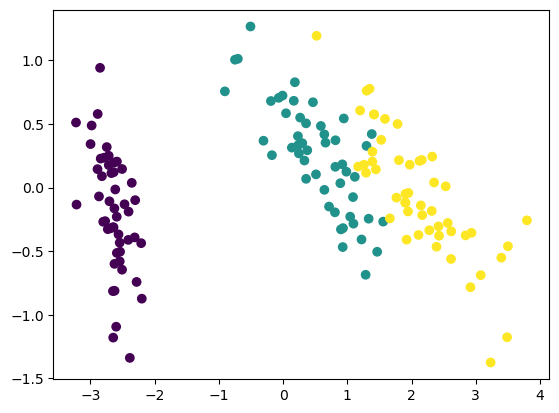

In [93]:
import matplotlib.pyplot as plt

plt.scatter(X_transformed[:,0],X_transformed[:,1], c=iris.target)